### Libraries

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation
from matplotlib.colors import Normalize
from matplotlib import cm
from IPython.display import HTML

#### Filename

In [3]:
filename = "110m_cultural.zip"

#### Introdcution to Geopandas

In [4]:
layers = gpd.list_layers(filename=filename)['name']
layers

0             ne_110m_admin_0_boundary_lines_land
1                       ne_110m_admin_0_countries
2                 ne_110m_admin_0_countries_lakes
3                       ne_110m_admin_0_map_units
4               ne_110m_admin_0_pacific_groupings
5                      ne_110m_admin_0_scale_rank
6                     ne_110m_admin_0_sovereignty
7                  ne_110m_admin_0_tiny_countries
8                ne_110m_admin_1_states_provinces
9          ne_110m_admin_1_states_provinces_lakes
10         ne_110m_admin_1_states_provinces_lines
11    ne_110m_admin_1_states_provinces_scale_rank
12                       ne_110m_populated_places
13                ne_110m_populated_places_simple
Name: name, dtype: object

In [5]:
world = gpd.read_file(
    filename,
    layer='ne_110m_admin_0_countries',
)
world

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Admin-0 country,1,2,Canada,CAN,0,2,Sovereign country,1,Canada,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,Admin-0 country,1,5,Republic of Serbia,SRB,0,2,Sovereign country,1,Republic of Serbia,...,None,None,None,None,None,None,None,None,None,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,Admin-0 country,1,6,Montenegro,MNE,0,2,Sovereign country,1,Montenegro,...,None,None,None,None,None,None,None,None,None,"POLYGON ((20.0707 42.58863, 19.80161 42.50009,..."
174,Admin-0 country,1,6,Kosovo,KOS,0,2,Disputed,1,Kosovo,...,Admin-0 country,Unrecognized,Admin-0 country,Unrecognized,Admin-0 country,Admin-0 country,Admin-0 country,Admin-0 country,Unrecognized,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,Admin-0 country,1,5,Trinidad and Tobago,TTO,0,2,Sovereign country,1,Trinidad and Tobago,...,None,None,None,None,None,None,None,None,None,"POLYGON ((-61.68 10.76, -61.105 10.89, -60.895..."


In [6]:
[col for col in world.columns]

['featurecla',
 'scalerank',
 'LABELRANK',
 'SOVEREIGNT',
 'SOV_A3',
 'ADM0_DIF',
 'LEVEL',
 'TYPE',
 'TLC',
 'ADMIN',
 'ADM0_A3',
 'GEOU_DIF',
 'GEOUNIT',
 'GU_A3',
 'SU_DIF',
 'SUBUNIT',
 'SU_A3',
 'BRK_DIFF',
 'NAME',
 'NAME_LONG',
 'BRK_A3',
 'BRK_NAME',
 'BRK_GROUP',
 'ABBREV',
 'POSTAL',
 'FORMAL_EN',
 'FORMAL_FR',
 'NAME_CIAWF',
 'NOTE_ADM0',
 'NOTE_BRK',
 'NAME_SORT',
 'NAME_ALT',
 'MAPCOLOR7',
 'MAPCOLOR8',
 'MAPCOLOR9',
 'MAPCOLOR13',
 'POP_EST',
 'POP_RANK',
 'POP_YEAR',
 'GDP_MD',
 'GDP_YEAR',
 'ECONOMY',
 'INCOME_GRP',
 'FIPS_10',
 'ISO_A2',
 'ISO_A2_EH',
 'ISO_A3',
 'ISO_A3_EH',
 'ISO_N3',
 'ISO_N3_EH',
 'UN_A3',
 'WB_A2',
 'WB_A3',
 'WOE_ID',
 'WOE_ID_EH',
 'WOE_NOTE',
 'ADM0_ISO',
 'ADM0_DIFF',
 'ADM0_TLC',
 'ADM0_A3_US',
 'ADM0_A3_FR',
 'ADM0_A3_RU',
 'ADM0_A3_ES',
 'ADM0_A3_CN',
 'ADM0_A3_TW',
 'ADM0_A3_IN',
 'ADM0_A3_NP',
 'ADM0_A3_PK',
 'ADM0_A3_DE',
 'ADM0_A3_GB',
 'ADM0_A3_BR',
 'ADM0_A3_IL',
 'ADM0_A3_PS',
 'ADM0_A3_SA',
 'ADM0_A3_EG',
 'ADM0_A3_MA',
 'ADM0_A3_PT

#### Creating a smaller subset of whole table with geometry shapes and ISO codes

In [7]:
subset = world.loc[:,['SOV_A3', 'ISO_A3','SOVEREIGNT', 'CONTINENT', 'POP_EST', 'geometry']]
subset

,SOV_A3,ISO_A3,SOVEREIGNT,CONTINENT,POP_EST,geometry
0,FJI,FJI,Fiji,Oceania,889953.0,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,TZA,TZA,United Republic of Tanzania,Africa,58005463.0,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,SAH,ESH,Western Sahara,Africa,603253.0,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,CAN,CAN,Canada,North America,37589262.0,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,US1,USA,United States of America,North America,328239523.0,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
...,...,...,...,...,...,...
172,SRB,SRB,Republic of Serbia,Europe,6944975.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,MNE,MNE,Montenegro,Europe,622137.0,"POLYGON ((20.0707 42.58863, 19.80161 42.50009,..."
174,KOS,-99,Kosovo,Europe,1794248.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,TTO,TTO,Trinidad and Tobago,North America,1394973.0,"POLYGON ((-61.68 10.76, -61.105 10.89, -60.895..."


In [8]:
subset.describe(include='object').T

,count,unique,top,freq
SOV_A3,177,171,FR1,3
ISO_A3,177,173,-99,5
SOVEREIGNT,177,171,France,3
CONTINENT,177,8,Africa,51


In [9]:
subset.SOV_A3.value_counts()

SOV_A3
FR1    3
DN1    2
US1    2
GB1    2
IS1    2
      ..
GNB    1
LBR    1
SLE    1
BFA    1
SDS    1
Name: count, Length: 171, dtype: int64

In [10]:
world.loc[world['SOV_A3']=='GB1', ['NAME']]

,NAME
20,Falkland Is.
143,United Kingdom


#### Creating a map

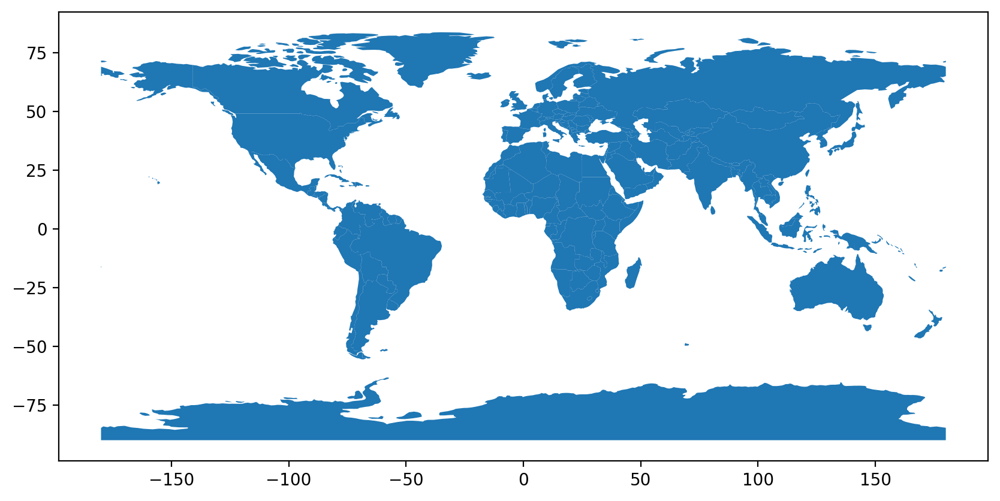

In [11]:
fig, ax = plt.subplots(
    dpi=200,
    figsize=(10,10),
)

subset.plot(
    ax=ax,
);

#### Scaling the map

In [12]:
subset = subset.to_crs(
    epsg=3395
)
subset.crs

<Projected CRS: EPSG:3395>
Name: WGS 84 / World Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World between 80°S and 84°N.
- bounds: (-180.0, -80.0, 180.0, 84.0)
Coordinate Operation:
- name: World Mercator
- method: Mercator (variant A)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

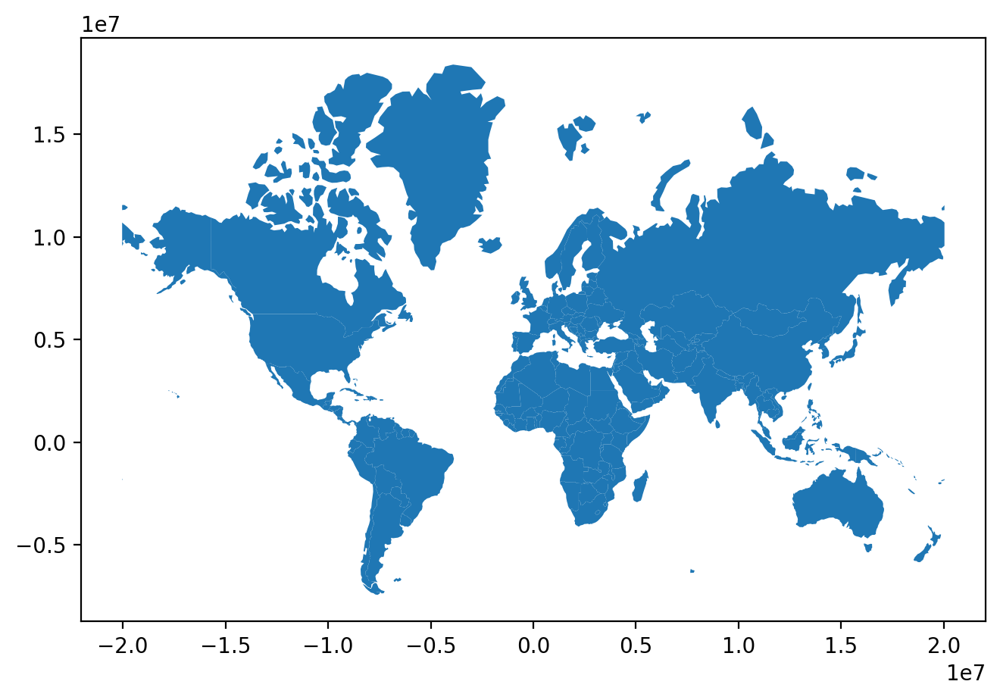

In [13]:
fig, ax = plt.subplots(
    dpi=200,
    figsize=(8,5),
)

subset[subset['CONTINENT'] != 'Antarctica'].plot(
    ax=ax,
);

# Plot a Choropleth map focusing on a single continent

Apply what you learned about how to create your own Choropleth maps by selecting a continent (not Antarctica, please ;-) and plotting the percentage of the population using the Internet for each country displayed. Since this dataset includes historical data, you need to select a specific year of your interest as well before being able to plot the data on a map!

### Chosing Europe as an Continent

In [14]:
europes = subset[subset['CONTINENT'] == 'Europe']
europes = europes[europes['ISO_A3'] != 'RUS']
europes

,SOV_A3,ISO_A3,SOVEREIGNT,CONTINENT,POP_EST,geometry
21,NOR,-99,Norway,Europe,5347896.0,"MULTIPOLYGON (((1685691.012 15291119.615, 1727..."
43,FR1,-99,France,Europe,67059887.0,"MULTIPOLYGON (((-5750519.703 459981.367, -5816..."
110,SWE,SWE,Sweden,Europe,10285453.0,"POLYGON ((1227561.058 8112756.364, 1276642.191..."
111,BLR,BLR,Belarus,Europe,9466856.0,"POLYGON ((3136616.945 7556635.518, 3253814.546..."
112,UKR,UKR,Ukraine,Europe,44385155.0,"POLYGON ((3538400.494 6784791.229, 3579972.485..."
113,POL,POL,Poland,Europe,37970874.0,"POLYGON ((2614241.13 7119046.597, 2619073.31 7..."
114,AUT,AUT,Austria,Europe,8877067.0,"POLYGON ((1890167.86 6095593.504, 1881717.299 ..."
115,HUN,HUN,Hungary,Europe,9769949.0,"POLYGON ((2458558.676 6145414.067, 2520364.547..."
116,MDA,MDA,Moldova,Europe,2657637.0,"POLYGON ((2963251.016 6111774.703, 2989799.238..."
117,ROU,ROU,Romania,Europe,19356544.0,"POLYGON ((3142944.799 5668239.409, 3192618.449..."


#### Plotting europe on a plot

<Axes: title={'center': 'Europe'}, xlabel='latitude', ylabel='longitude'>

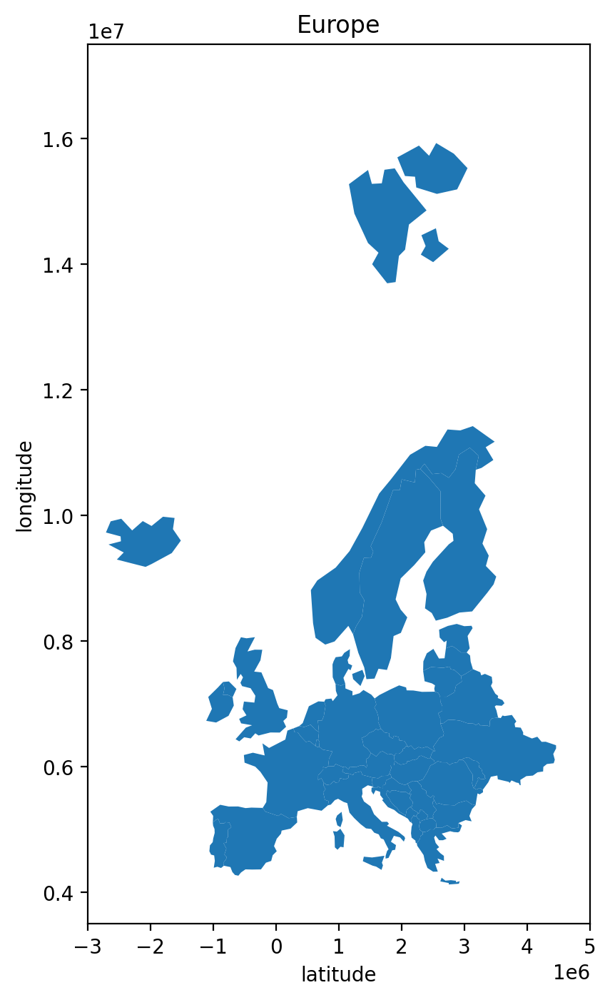

In [15]:
fig, ax = plt.subplots(
    dpi=200,
    figsize=(8,8),
)

ax.set_xlim(-3e6, 5e6)
ax.set_ylim(0.35e7, 1.75e7)

plt.title('Europe')
plt.xlabel('latitude')
plt.ylabel('longitude')

europes.plot(
    ax=ax,)

#### Reading from the internet usage dataset

In [16]:
internet_usage = pd.read_csv('internet_usage.csv')
internet_usage

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Unnamed: 68
0,Aruba,ABW,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,88.6612,93.5425,97.1700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,AFE,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,14.3000,15.7000,17.4000,19.800,22.8000,26.0000,29.5000,31.4000,34.9,NaN
2,Afghanistan,AFG,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,8.2600,11.0000,13.5000,16.800,17.6000,18.4000,NaN,NaN,NaN,NaN
3,Africa Western and Central,AFW,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,17.2000,19.9000,23.2000,25.700,28.9000,32.4000,34.3000,36.9000,39.4,NaN
4,Angola,AGO,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,22.0000,23.2000,26.0000,29.000,32.1294,36.6347,37.8067,39.2935,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,83.8936,89.443,NaN,NaN,NaN,NaN,NaN,NaN
262,"Yemen, Rep.",YEM,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,24.0854,24.5792,26.7184,NaN,NaN,13.8152,14.8881,17.6948,NaN,NaN
263,South Africa,ZAF,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,51.9191,54.0000,56.1674,62.400,69.6969,72.1128,74.1534,74.7030,NaN,NaN
264,Zambia,ZMB,Individuals using the Internet (% of population),IT.NET.USER.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,8.8000,10.3000,12.2000,14.300,18.7000,24.4992,26.9505,31.2342,NaN,NaN


#### Getting only countries from europe

In [17]:
# getting countries from europe
europe_internet = internet_usage[internet_usage['Country Name'].isin(europes['SOVEREIGNT'])]

# interpolating missing values
europe_internet = europe_internet.fillna(0)

# removing unnecessary columns
europe_internet = europe_internet.drop(columns=['Indicator Name', 'Indicator Code'])

europe_internet

,Country Name,Country Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Unnamed: 68
5,Albania,ALB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,56.9000,59.6000,62.4000,65.4000,68.5504,72.2377,79.3237,82.6137,83.1356,0.0
14,Austria,AUT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,83.9401,84.3237,87.9356,87.4791,87.7522,87.5294,92.5292,93.6141,95.3347,0.0
17,Belgium,BEL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,85.0529,86.5165,87.6797,88.6473,90.2754,91.5264,92.7887,94.0078,94.6263,0.0
21,Bulgaria,BGR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,56.6563,59.8255,63.4101,64.7820,67.9470,70.1625,75.2714,79.1269,80.3896,0.0
24,Bosnia and Herzegovina,BIH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,52.6000,60.2565,64.8920,70.1201,69.9463,73.2118,75.6762,78.8455,83.3772,0.0
25,Belarus,BLR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,62.2304,71.1130,74.4364,79.1299,82.7892,85.0879,86.8884,89.5073,91.5125,0.0
37,Switzerland,CHE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,87.4791,89.1347,89.6861,91.8000,93.1461,94.3499,95.5694,96.8046,97.3444,0.0
54,Czechia,CZE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,75.6688,76.4812,78.7192,80.6882,80.8669,81.3389,82.6706,84.5401,85.9941,0.0
55,Germany,DEU,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,87.5898,84.1652,84.3942,87.0371,88.1345,89.8129,91.4306,91.6298,92.4764,0.0
58,Denmark,DNK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,96.3305,96.9678,97.0994,97.3192,98.0464,96.5491,98.8659,97.8601,98.7756,0.0


#### Merging the datasets

In [18]:
merged_europe_internet = europes.merge(europe_internet, left_on='SOVEREIGNT', right_on='Country Name')
merged_europe_internet

,SOV_A3,ISO_A3,SOVEREIGNT,CONTINENT,POP_EST,geometry,Country Name,Country Code,1960,1961,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Unnamed: 68
0,NOR,-99,Norway,Europe,5347896.0,"MULTIPOLYGON (((1685691.012 15291119.615, 1727...",Norway,NOR,0.0,0.0,...,96.8103,97.2982,96.3576,96.4917,98.0000,94.6076,99.0000,99.0000,99.0000,0.0
1,FR1,-99,France,Europe,67059887.0,"MULTIPOLYGON (((-5750519.703 459981.367, -5816...",France,FRA,0.0,0.0,...,78.0060,79.2698,80.5025,82.0432,83.3397,84.7064,86.0955,85.3333,86.8364,0.0
2,SWE,SWE,Sweden,Europe,10285453.0,"POLYGON ((1227561.058 8112756.364, 1276642.191...",Sweden,SWE,0.0,0.0,...,90.6102,89.6509,93.0063,89.2470,94.4934,94.5394,94.6703,95.0097,95.7033,0.0
3,BLR,BLR,Belarus,Europe,9466856.0,"POLYGON ((3136616.945 7556635.518, 3253814.546...",Belarus,BLR,0.0,0.0,...,62.2304,71.1130,74.4364,79.1299,82.7892,85.0879,86.8884,89.5073,91.5125,0.0
4,UKR,UKR,Ukraine,Europe,44385155.0,"POLYGON ((3538400.494 6784791.229, 3579972.485...",Ukraine,UKR,0.0,0.0,...,48.8846,53.0010,58.8895,62.5532,70.1248,75.0379,79.2183,0.0000,0.0000,0.0
5,POL,POL,Poland,Europe,37970874.0,"POLYGON ((2614241.13 7119046.597, 2619073.31 7...",Poland,POL,0.0,0.0,...,67.9970,73.3007,75.9854,77.5417,80.4359,83.1849,85.3749,86.9411,86.4147,0.0
6,AUT,AUT,Austria,Europe,8877067.0,"POLYGON ((1890167.86 6095593.504, 1881717.299 ...",Austria,AUT,0.0,0.0,...,83.9401,84.3237,87.9356,87.4791,87.7522,87.5294,92.5292,93.6141,95.3347,0.0
7,HUN,HUN,Hungary,Europe,9769949.0,"POLYGON ((2458558.676 6145414.067, 2520364.547...",Hungary,HUN,0.0,0.0,...,72.8347,79.2594,76.7505,76.0744,80.3717,84.7712,88.6408,89.1428,91.4501,0.0
8,MDA,MDA,Moldova,Europe,2657637.0,"POLYGON ((2963251.016 6111774.703, 2989799.238...",Moldova,MDA,0.0,0.0,...,69.0000,71.0000,49.9000,50.3000,57.7605,58.2153,60.4747,63.5349,0.0000,0.0
9,ROU,ROU,Romania,Europe,19356544.0,"POLYGON ((3142944.799 5668239.409, 3192618.449...",Romania,ROU,0.0,0.0,...,55.7632,59.5040,63.7473,70.6813,73.6575,78.4553,83.5904,85.5031,89.2034,0.0


In [38]:
# reference to website on which i found how to animate geopandas https://www.kaggle.com/code/kennethgranahan/plot-animate-statistical-data-with-geopandas

def animate_internet_usage(dataframe, title,colors='viridis', x_lim=(-3e6, 5e6), y_lim=(0.35e7, 1.75e7)):
    # copying the dataframa I will use for plotting
    PlotData = dataframe.copy()


    # melting the dataframe
    PlotData_melted = PlotData.melt(id_vars=['SOV_A3', 'ISO_A3', 'SOVEREIGNT', 'CONTINENT', 'POP_EST', 'geometry', 'Country Code'], # what will be the same
                                    value_vars=[str(year) for year in range(1960, 2024)], #which columns will be melted into single column
                                    var_name='Year',  # name of the new column from value_vars
                                    value_name='Internet Usage') # name column which will hold values from value_vars

    # convert the year column to an integer
    PlotData_melted['Year'] = PlotData_melted['Year'].astype(int)

    # set up the data column for color mapping
    zdata = 'Internet Usage'
    colors = colors

    # creating a figure with two subplots
    fig, [ax, cax] = plt.subplots(1, 2,
                                figsize=(10, 10),
                                gridspec_kw={"width_ratios": [50, 1]} # specifies the relative width of each subplot
                                )

    # removing axis
    ax.axis('off')

    # creating a color mapping for the colorbar
    vmin = PlotData_melted[zdata].min()
    vmax = PlotData_melted[zdata].max()
    cmap = cm.ScalarMappable(Normalize(vmin, vmax), colors) # normalizing the color mapping

    # create the colorbar with colormap
    plt.colorbar(mappable=cmap, cax=cax)
    cax.set_title('Internet Usage (%)')

    # function to plot the data for each frame
    def plot_frame(year):
        ax.clear()  # clear the previous plot for the new frame
        ax.set_title(f'{title}(1 second = 1 Year): {year}')

        ax.set_xlim(x_lim[0], x_lim[1])
        ax.set_ylim(y_lim[0], y_lim[1])

        ax.set_xticks([])
        ax.set_yticks([])
        # filter the data for the current year
        year_data = PlotData_melted[PlotData_melted['Year'] == year]

        # plot the data
        year_data.plot(column=zdata, ax=ax, vmin=vmin, vmax=vmax, cmap=colors, legend=False)
        plt.close()

    # create the animation with the plot_frame function and the range of years
    anim = FuncAnimation(fig, plot_frame, frames=range(1960, 2024), interval=100)

    return anim

In [39]:
europe_animation = animate_internet_usage(merged_europe_internet, title='Internet Usage in Europe')
HTML(europe_animation.to_jshtml())

# Plot the Internet usage of a single country over time

Next make use of the historical data provided in the dataset linked above and single out a specific country. Visualize how the Internet usage over time changed for its population!


#### Selecting specific country from internet usage dataframe

In [21]:
poland = merged_europe_internet[merged_europe_internet['SOVEREIGNT'] == 'Poland']
poland

,SOV_A3,ISO_A3,SOVEREIGNT,CONTINENT,POP_EST,geometry,Country Name,Country Code,1960,1961,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Unnamed: 68
5,POL,POL,Poland,Europe,37970874.0,"POLYGON ((2614241.13 7119046.597, 2619073.31 7...",Poland,POL,0.0,0.0,...,67.997,73.3007,75.9854,77.5417,80.4359,83.1849,85.3749,86.9411,86.4147,0.0


#### Creating an animation with internet usaage throught the years

In [40]:
poland_animation = animate_internet_usage(poland, x_lim=(1e6, 3.2e6), y_lim=(0.6e7, 0.8e7), title='Internet Usage in Poland throughout the years')
HTML(poland_animation.to_jshtml())

### Linechart of internet usage in Poland

c:\Python312\Lib\site-packages\matplotlib\cbook.py:1699: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


<function matplotlib.pyplot.show(close=None, block=None)>

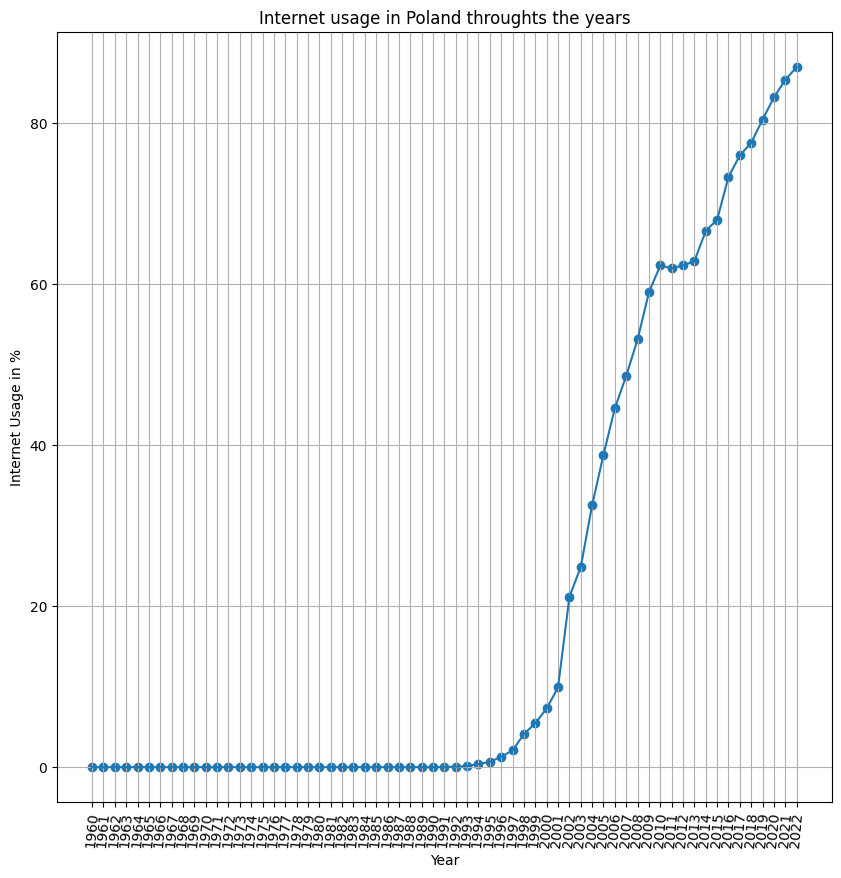

In [35]:
years = [str(i) for i in range(1960, 2023)]
values = [poland[year] for year in years]

plt.figure(figsize=(10,10))
plt.plot(years, values)
plt.scatter(years,values)
plt.title("Internet usage in Poland throughts the years")
plt.xlabel("Year")
plt.xticks(rotation=85)
plt.ylabel("Internet Usage in %")
plt.grid()

plt.show

# Create one additional Choropleth Map of your choosing

Find some other information to overlay on a map of a country, continent or other part of the world. The easiest way to achieve this is by finding open source data that is geocoded in some way (e.g. with ISO country codes) and joining it onto the dataframes available from naturalearthdata.com containing geographic data. One possible source of such data is data.worldbank.org.


#### Wrold Crime Index (mid 2022)

In [ ]:
# data from https://www.kaggle.com/datasets/ahmadjalalmasood123/world-crime-index?resource=download

world_crime_index = pd.read_csv('world_crime_index.csv')
world_crime_index

,Rank,City,Crime Index,Safety Index
0,1,"Caracas, Venezuela",83.98,16.02
1,2,"Pretoria, South Africa",81.98,18.02
2,3,"Celaya, Mexico",81.80,18.20
3,4,"San Pedro Sula, Honduras",80.87,19.13
4,5,"Port Moresby, Papua New Guinea",80.71,19.29
...,...,...,...,...
448,449,"Quebec City, Canada",15.14,84.86
449,450,"Taipei, Taiwan",15.05,84.95
450,451,"San Sebastian, Spain",14.86,85.14
451,452,"Doha, Qatar",13.96,86.04


#### Splittig "City" column into City and Country

In [ ]:
# spliting City and Country
cities = world_crime_index['City'].to_list()

countries = [city.split(',')[-1] for city in cities]
countries = [country.strip() for country in countries]

world_crime_index['Country'] = countries
world_crime_index.loc[world_crime_index['Country'] == 'United States', 'Country'] = 'United States of America'
world_crime_index

,Rank,City,Crime Index,Safety Index,Country
0,1,"Caracas, Venezuela",83.98,16.02,Venezuela
1,2,"Pretoria, South Africa",81.98,18.02,South Africa
2,3,"Celaya, Mexico",81.80,18.20,Mexico
3,4,"San Pedro Sula, Honduras",80.87,19.13,Honduras
4,5,"Port Moresby, Papua New Guinea",80.71,19.29,Papua New Guinea
...,...,...,...,...,...
448,449,"Quebec City, Canada",15.14,84.86,Canada
449,450,"Taipei, Taiwan",15.05,84.95,Taiwan
450,451,"San Sebastian, Spain",14.86,85.14,Spain
451,452,"Doha, Qatar",13.96,86.04,Qatar


In [ ]:
print(countries)

['Venezuela', 'South Africa', 'Mexico', 'Honduras', 'Papua New Guinea', 'South Africa', 'South Africa', 'Afghanistan', 'Brazil', 'Brazil', 'Brazil', 'South Africa', 'Brazil', 'Trinidad And Tobago', 'United States', 'Brazil', 'Argentina', 'United States', 'United States', 'Australia', 'South Africa', 'Brazil', 'Mexico', 'Jamaica', 'South Africa', 'United Kingdom', 'United States', 'Peru', 'Ecuador', 'Brazil', 'United States', 'El Salvador', 'Colombia', 'Mexico', 'Namibia', 'Puerto Rico', 'Dominican Republic', 'United Kingdom', 'Syria', 'Angola', 'United States', 'United States', 'Brazil', 'United States', 'Nigeria', 'United States', 'France', 'Colombia', 'Philippines', 'Canada', 'United States', 'United States', 'Kazakhstan', 'Maldives', 'Canada', 'Bangladesh', 'United States', 'Brazil', 'Italy', 'Malaysia', 'Argentina', 'Malaysia', 'United States', 'United Kingdom', 'Guatemala', 'France', 'Libya', 'United States', 'Brazil', 'Mexico', 'Canada', 'Canada', 'Philippines', 'Ecuador', 'Mexic

#### Getting average values for each country

In [ ]:
average_crime_index = world_crime_index.groupby('Country')['Crime Index'].mean().reset_index()
average_crime_index

,Country,Crime Index
0,Afghanistan,79.390000
1,Albania,44.500000
2,Algeria,53.880000
3,Angola,67.450000
4,Argentina,66.273333
...,...,...
113,Uruguay,54.810000
114,Uzbekistan,33.860000
115,Venezuela,83.980000
116,Vietnam,45.865000


#### Merging dataset with world dataset

In [ ]:
# getting all the countries from the world dataset
sovereign_countries = subset['SOVEREIGNT'].to_list()

# looking for missing countries in the average_crime_index
missing_countries = [country for country in sovereign_countries if country not in average_crime_index['Country'].to_list()]

# adding missing countries to the average_crime_index
missing_countries = pd.DataFrame(missing_countries, columns=['Country'])
missing_countries['Crime Index'] = 0
average_crime_index = pd.concat([average_crime_index, missing_countries])
average_crime_index = average_crime_index[average_crime_index['Country'] != 'Antarctica']
average_crime_index['Country'] = average_crime_index['Country'].replace('United States', 'United States of America')

# remove not unique countries
average_crime_index = average_crime_index.drop_duplicates(subset='Country')

average_crime_index



,Country,Crime Index
0,Afghanistan,79.390000
1,Albania,44.500000
2,Algeria,53.880000
3,Angola,67.450000
4,Argentina,66.273333
...,...,...
58,Bosnia and Herzegovina,0.000000
59,Republic of Serbia,0.000000
60,Kosovo,0.000000
61,Trinidad and Tobago,0.000000


In [ ]:
crime_rate = subset.merge(average_crime_index, left_on='SOVEREIGNT', right_on='Country')
crime_rate

,SOV_A3,ISO_A3,SOVEREIGNT,CONTINENT,POP_EST,geometry,Country,Crime Index
0,FJI,FJI,Fiji,Oceania,889953.0,"MULTIPOLYGON (((20037508.343 -1800679.237, 200...",Fiji,0.000000
1,TZA,TZA,United Republic of Tanzania,Africa,58005463.0,"POLYGON ((3774143.866 -105050.44, 3792946.708 ...",United Republic of Tanzania,0.000000
2,SAH,ESH,Western Sahara,Africa,603253.0,"POLYGON ((-964649.018 3185897.152, -964597.245...",Western Sahara,0.000000
3,CAN,CAN,Canada,North America,37589262.0,"MULTIPOLYGON (((-13674486.249 6242596, -136894...",Canada,44.013158
4,US1,USA,United States of America,North America,328239523.0,"MULTIPOLYGON (((-13674486.249 6242596, -133583...",United States of America,51.306897
...,...,...,...,...,...,...,...,...
171,SRB,SRB,Republic of Serbia,Europe,6944975.0,"POLYGON ((2096126.508 5735055.661, 2096127.988...",Republic of Serbia,0.000000
172,MNE,MNE,Montenegro,Europe,622137.0,"POLYGON ((2234260.104 5220640.91, 2204305.52 5...",Montenegro,47.200000
173,KOS,-99,Kosovo,Europe,1794248.0,"POLYGON ((2292095.761 5110826.439, 2284604.344...",Kosovo,0.000000
174,TTO,TTO,Trinidad and Tobago,North America,1394973.0,"POLYGON ((-6866186.192 1196928.987, -6802177.4...",Trinidad and Tobago,0.000000


<Axes: title={'center': 'Crime Rate in the World in Mid 2022'}>

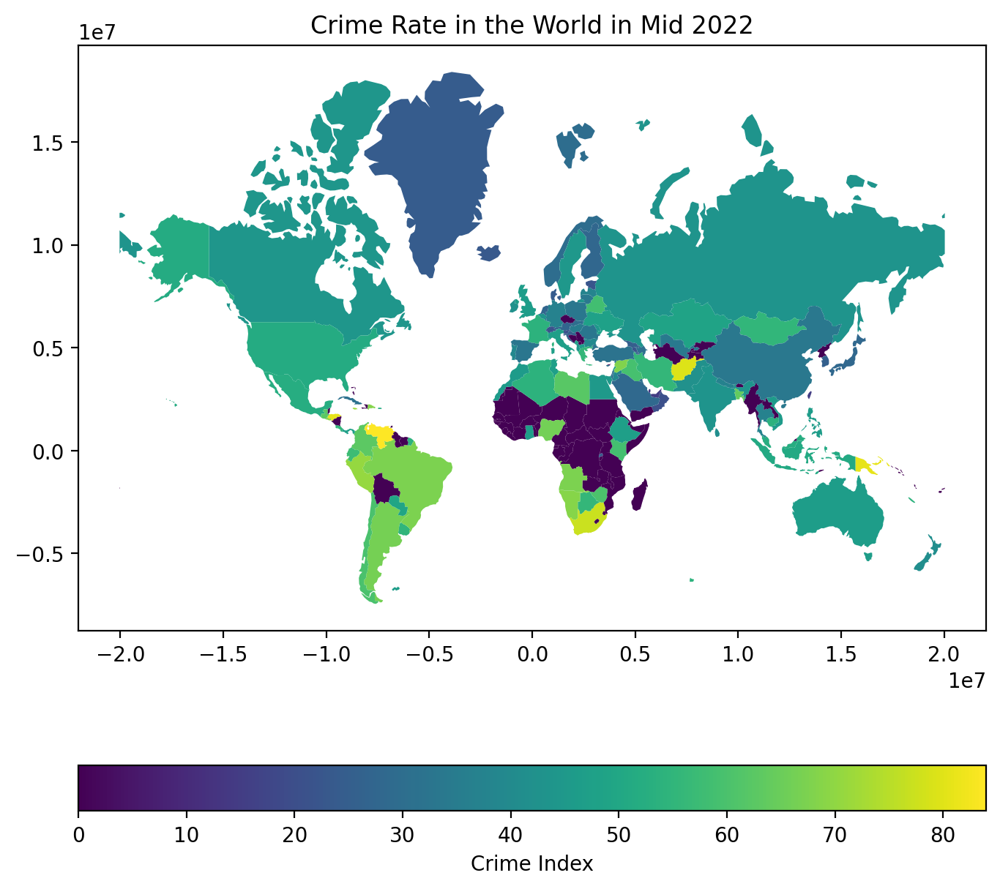

In [ ]:
# plotting the crime rate
fig, ax = plt.subplots(
    dpi=200,
    figsize=(8,8),
)

plt.title('Crime Rate in the World in Mid 2022')

crime_rate.plot(
    column='Crime Index',
    ax=ax,
    legend=True,
    legend_kwds={'label': "Crime Index", 'orientation': "horizontal"},
    cmap='viridis'
)

 Dataset Overview: Crime and Safety Indices 2022 Mid-Year

This dataset provides an estimation of the overall crime level in various cities and countries around the world as of mid-2022. The indices in this dataset are based on historical data and are updated periodically.

## Key Metrics

1. **Crime Index**:
   - Measures the perceived level of crime in a city or country.
   - Interpreted as follows:
     - **Very Low**: Crime Index below 20
     - **Low**: Crime Index between 20 and 40
     - **Moderate**: Crime Index between 40 and 60
     - **High**: Crime Index between 60 and 80
     - **Very High**: Crime Index above 80

2. **Safety Index**:
   - Represents the level of safety in a city or country, calculated inversely from the Crime Index.
   - A high Safety Index suggests a safer environment.

## Comparison with Governmental Crime Statistics

While governmental statistics may provide detailed, official records based on the number of reported crimes per capita, this dataset offers a broader cross-country comparison. There are several reasons why these indices might offer different insights:

- **Variability in Crime Reporting**: Reporting rates vary significantly between countries. In some countries, citizens are more likely to report crimes, while in others, incidents may go unreported due to social, cultural, or institutional factors.
  
- **Potential Data Manipulation**: Some governments may adjust or limit reported crime data to portray a more favorable public image, impacting the reliability of official statistics.

- **Limited Global Coverage**: Governmental crime data is not uniformly available worldwide, and in some regions, official statistics are sparse or nonexistent.

## Advantages of This Dataset

Despite potential limitations in precision, the dataset's standardized indices enable a useful cross-country comparison of perceived crime and safety levels. By reflecting public perception rather than reported crime rates alone, it can provide unique insights into how safe or unsafe people feel in different parts of the world.